In [7]:
import os
import pandas as pd
import numpy as np
import sys

from dotenv import load_dotenv
from openai import AzureOpenAI

from langchain_openai import AzureChatOpenAI
from langchain.schema import HumanMessage

import csv
import json
import time
from datetime import date, datetime

print('Python version:', sys.version)
print('Python executable:', sys.executable)
print('pandas version:', pd.__version__)
print('\nCurrent working directory:', os.getcwd())

Python version: 3.13.5 | packaged by Anaconda, Inc. | (main, Jun 12 2025, 16:37:03) [MSC v.1929 64 bit (AMD64)]
Python executable: c:\Users\Denis_Davydov2\miniconda3_25\python.exe
pandas version: 2.3.1

Current working directory: c:\Users\Denis_Davydov2\OneDrive\Scipts\Py_Scripts\EPAM\Prophet\AI_skills\Ver_2


## Get smolai texts

In [9]:
# Get texts
file_path = 'C:\\Users\\Denis_Davydov2\\OneDrive - EPAM\\Prophet_AI_docs\\Datasets\\AI_skills\\'
file_name = 'smolai_texts_cleaned_2025-11-14.csv'


smalai = pd.read_csv(file_path+file_name)
print("File read: ", file_name)


tokens_total = smalai['token_count'].sum()
print("Total tokens", tokens_total)
smalai

File read:  smolai_texts_cleaned_2025-11-14.csv
Total tokens 2030998


,title,issue_date,content_deduped,token_count
0,Cursor 2.0 & Composer-1: Fast Models and New A...,2025-10-29,Open-weight safety models and moderation tooli...,4359
1,OpenAI completes Microsoft + For-profit restru...,2025-10-28,"OpenAIs new structure, Microsoft deal, and ope...",5932
2,MiniMax M2 230BA10B â 8% of Claude Sonnet's ...,2025-10-27,MiniMax M2 open-weights release: sparse MoE fo...,5143
3,not much happened today,2025-10-24,Serving and Production Platforms: vLLM x NVIDI...,4863
4,not much happened today,2025-10-23,"Agent ops, observability, and real-world envs\...",4366
...,...,...,...,...
408,Terminal-Bench 2.0 and Harbor,2025-11-07,Moonshot AIs Kimi K2 Thinking: 1T INT4 open-we...,5912
409,not much happened today,2025-11-10,"Moonshot AIs Kimi K2 Thinking: AMA takeaways, ...",6322
410,not much happened today,2025-11-11,Reasoning benchmarks and training techniques\n...,6221
411,"GPT 5.1 in ChatGPT: No evals, but adaptive thi...",2025-11-12,Autonomy and Physical AI: Waymo freeway rollou...,4925


## Clean texts

In [10]:
# Normalize punctuation, spaces, and general Unicode forms to ensure consistent UTF-8 friendly text
import unicodedata
import re

# Start from smalai['content_deduped'] column
clean_content = smalai['content_deduped'].copy()

# 1. Unicode normalization (NFKC) to flatten compatibility characters (e.g., full-width forms)
clean_content = clean_content.apply(lambda x: unicodedata.normalize('NFKC', x) if isinstance(x, str) else x)

# 2. Replace various space characters with a regular space
SPACE_CHARS = [
    '\u00A0',  # no-break space
    '\u1680', '\u2000', '\u2001', '\u2002', '\u2003', '\u2004', '\u2005', '\u2006',
    '\u2007', '\u2008', '\u2009', '\u200A', '\u202F', '\u205F', '\u3000'
]
space_pattern = re.compile('|'.join(SPACE_CHARS))
clean_content = clean_content.str.replace(space_pattern, ' ', regex=True)

# 3. Standardize punctuation (commas, colons, semicolons, quotes)
PUNCT_MAP = {
    '，': ',',  # full-width comma
    '､': ',',
    '﹐': ',',
    '：': ':',  # full-width colon
    '；': ';',
    '﹔': ';',
    '﹕': ':',
    '"': '"', '"': '"', '‟': '"', '＂': '"',
    ''': "'", ''': "'", '‚': "'", '‛': "'", '＇': "'",
    '…': '...',
}
if PUNCT_MAP:
    punct_pattern = re.compile('|'.join(map(re.escape, PUNCT_MAP.keys())))
    clean_content = clean_content.str.replace(punct_pattern, lambda m: PUNCT_MAP[m.group(0)], regex=True)

# 4. Standardize various types of hyphens and dashes with standard hyphen
clean_content = clean_content.str.replace('–', '-')  # en dash
clean_content = clean_content.str.replace('—', '-')  # em dash
clean_content = clean_content.str.replace('‐', '-')  # hyphen
clean_content = clean_content.str.replace('\u2010', '-')  # hyphen
clean_content = clean_content.str.replace('\u2011', '-')  # non-breaking hyphen
clean_content = clean_content.str.replace('\u2012', '-')  # figure dash
clean_content = clean_content.str.replace('\u2013', '-')  # en dash
clean_content = clean_content.str.replace('\u2014', '-')  # em dash
clean_content = clean_content.str.replace('\u2015', '-')  # horizontal bar

# 5. Collapse multiple spaces to single and trim
clean_content = clean_content.str.replace(r'\s+', ' ', regex=True).str.strip()

# 6. Ensure UTF-8 encoding by converting to bytes and back
clean_content = clean_content.apply(lambda x: x.encode('utf-8', errors='ignore').decode('utf-8') if isinstance(x, str) else x)

# Store back in dataframe
smalai['content_clean'] = clean_content

print(f"Cleaned {len(clean_content)} text entries")
print(f"Sample cleaned text:\n{clean_content.iloc[0][:200]}...")
smalai


Cleaned 413 text entries
Sample cleaned text:
Open-weight safety models and moderation tooling OpenAIs gpt-oss-safeguard (20B, 120B) : Two open-weight reasoning models for policy-based safety classification, fine-tuned from gpt-oss and released u...


,title,issue_date,content_deduped,token_count,content_clean
0,Cursor 2.0 & Composer-1: Fast Models and New A...,2025-10-29,Open-weight safety models and moderation tooli...,4359,Open-weight safety models and moderation tooli...
1,OpenAI completes Microsoft + For-profit restru...,2025-10-28,"OpenAIs new structure, Microsoft deal, and ope...",5932,"OpenAIs new structure, Microsoft deal, and ope..."
2,MiniMax M2 230BA10B â 8% of Claude Sonnet's ...,2025-10-27,MiniMax M2 open-weights release: sparse MoE fo...,5143,MiniMax M2 open-weights release: sparse MoE fo...
3,not much happened today,2025-10-24,Serving and Production Platforms: vLLM x NVIDI...,4863,Serving and Production Platforms: vLLM x NVIDI...
4,not much happened today,2025-10-23,"Agent ops, observability, and real-world envs\...",4366,"Agent ops, observability, and real-world envs ..."
...,...,...,...,...,...
408,Terminal-Bench 2.0 and Harbor,2025-11-07,Moonshot AIs Kimi K2 Thinking: 1T INT4 open-we...,5912,Moonshot AIs Kimi K2 Thinking: 1T INT4 open-we...
409,not much happened today,2025-11-10,"Moonshot AIs Kimi K2 Thinking: AMA takeaways, ...",6322,"Moonshot AIs Kimi K2 Thinking: AMA takeaways, ..."
410,not much happened today,2025-11-11,Reasoning benchmarks and training techniques\n...,6221,Reasoning benchmarks and training techniques S...
411,"GPT 5.1 in ChatGPT: No evals, but adaptive thi...",2025-11-12,Autonomy and Physical AI: Waymo freeway rollou...,4925,Autonomy and Physical AI: Waymo freeway rollou...


In [21]:
# Sort dataframe by issue_date and title
smalai = smalai.sort_values(by=['issue_date', 'title']).reset_index(drop=True)

# Add text_id column as sequential index
smalai['text_id'] = range(len(smalai))

print(f"Sorted {len(smalai)} texts by issue_date and title")
print(f"Added text_id column")
smalai.head(10)

Sorted 413 texts by issue_date and title
Added text_id column


,title,issue_date,content_deduped,token_count,content_clean,text_id
0,AdamW -> AaronD?,2024-04-01,AI Capabilities and Limitations\nLimitations o...,1630,AI Capabilities and Limitations Limitations of...,0
1,Not much happened today,2024-04-02,AI Models and Architectures\nDBRX : person_132...,3028,AI Models and Architectures DBRX : person_1325...,1
2,ReALM: Reference Resolution As Language Modeling,2024-04-03,Anthropic Research on Jailbreaking LLMs\nMany-...,1874,Anthropic Research on Jailbreaking LLMs Many-s...,2
3,"Cohere Command R+, Anthropic Claude Tool Use, ...",2024-04-04,Cohere Command R+ Release\nNew open-source mod...,1853,Cohere Command R+ Release New open-source mode...,3
4,Mixture of Depths: Dynamically allocating comp...,2024-04-05,AI Models and Architectures\nGoogles Training ...,2253,AI Models and Architectures Googles Training L...,4
5,Anime pfp anon eclipses $10k A::B prompting ch...,2024-04-08,AI and Robotics Research Developments\nAI and ...,2154,AI and Robotics Research Developments AI and r...,5
6,Gemini Pro and GPT4T Vision go GA on the same ...,2024-04-09,Cohere Command R+ Model Performance\nCommand R...,2752,Cohere Command R+ Model Performance Command R+...,6
7,Music's Dall-E moment,2024-04-10,GPT-4 Turbo Model Improvements\nImproved reaso...,1954,GPT-4 Turbo Model Improvements Improved reason...,7
8,"Mergestral, Meta MTIAv2, Cohere Rerank 3, Goog...",2024-04-11,LLM Developments\nMixtral-8x22B Release : pers...,2036,LLM Developments Mixtral-8x22B Release : perso...,8
9,Zero to GPT in 1 Year,2024-04-12,GPT-4 and Claude Updates\nGPT-4 Turbo regains ...,1395,GPT-4 and Claude Updates GPT-4 Turbo regains t...,9


## Chunk texts into overlapping sentence-based segments

Split cleaned text into chunks of 3-6 sentences with 1-2 sentence overlap for embedding.

In [22]:
import nltk
from nltk.tokenize import sent_tokenize

# Download sentence tokenizer if not already available
try:
    nltk.data.find('tokenizers/punkt_tab')
except LookupError:
    nltk.download('punkt_tab', quiet=False)

def chunk_text_by_sentences(text, chunk_size=5, overlap=2):
    """
    Split text into overlapping chunks based on sentences.
    
    Args:
        text: Input text string
        chunk_size: Number of sentences per chunk (3-6 recommended)
        overlap: Number of sentences to overlap between chunks (1-2 recommended)
    
    Returns:
        List of text chunks
    """
    if not isinstance(text, str) or not text.strip():
        return []
    
    # Tokenize into sentences
    sentences = sent_tokenize(text)
    
    if len(sentences) == 0:
        return []
    
    # If text is short, return as single chunk
    if len(sentences) <= chunk_size:
        return [text]
    
    chunks = []
    step = chunk_size - overlap
    
    for i in range(0, len(sentences), step):
        chunk_sentences = sentences[i:i + chunk_size]
        if chunk_sentences:  # Only add non-empty chunks
            chunk_text = ' '.join(chunk_sentences)
            chunks.append(chunk_text)
        
        # Stop if we've reached the end
        if i + chunk_size >= len(sentences):
            break
    
    return chunks

# Test on a sample text
sample_text = smalai['content_clean'].iloc[0]
sample_chunks = chunk_text_by_sentences(sample_text, chunk_size=4, overlap=1)

print(f"Sample text length: {len(sample_text)} characters")
print(f"Number of chunks created: {len(sample_chunks)}")
print(f"\nFirst chunk:\n{sample_chunks[0][:300]}...")
if len(sample_chunks) > 1:
    print(f"\nSecond chunk (showing overlap):\n{sample_chunks[1][:300]}...")

Sample text length: 7681 characters
Number of chunks created: 16

First chunk:
AI Capabilities and Limitations Limitations of current AI systems : person_089 noted that memorization, which ML has solely focused on, is not intelligence. Any task that does not involve significant novelty and uncertainty can be solved via memorization, but skill is never a sign of intelligence. p...

Second chunk (showing overlap):
Limitations of benchmarks in assessing AI capabilities : person_065 questioned if we are on the right way for evaluating large vision-language models (LVLMs). They identified two primary issues in current benchmarks: visual content being unnecessary for many samples and unintentional data leakage in...


In [24]:
# Apply chunking to all texts and create expanded dataframe
chunks_data = []

for idx, row in smalai.iterrows():
    text = row['content_clean']
    chunks = chunk_text_by_sentences(text, chunk_size=3, overlap=1)
    
    for chunk_idx, chunk_text in enumerate(chunks):
        chunk_record = {
            'text_id': row.get('text_id', ''),
            'issue_date': row.get('issue_date', ''),
            'chunk_index': chunk_idx,
            'chunk_text': chunk_text,
            'chunk_length': len(chunk_text)
        }
        chunks_data.append(chunk_record)

# Create chunks dataframe
chunks_df = pd.DataFrame(chunks_data)

print(f"Original texts: {len(smalai)}")
print(f"Total chunks created: {len(chunks_df)}")
print(f"Average chunks per text: {len(chunks_df) / len(smalai):.2f}")
print(f"\nChunk length statistics:")
print(chunks_df['chunk_length'].describe())
print(f"\nSample chunks:")
chunks_df.head(10)

Original texts: 413
Total chunks created: 29657
Average chunks per text: 71.81

Chunk length statistics:
count    29657.000000
mean       495.246451
std        155.479701
min         18.000000
25%        388.000000
50%        483.000000
75%        588.000000
max       2870.000000
Name: chunk_length, dtype: float64

Sample chunks:


,text_id,issue_date,chunk_index,chunk_text,chunk_length
0,0,2024-04-01,0,AI Capabilities and Limitations Limitations of...,535
1,0,2024-04-01,1,person_089 shared a paper introducing a formal...,548
2,0,2024-04-01,2,They identified two primary issues in current ...,608
3,0,2024-04-01,3,AI Development and Deployment Mojo programming...,354
4,0,2024-04-01,4,Claude 3 beating GPT-4 : person_980 reported t...,359
5,0,2024-04-01,5,Microsoft and OpenAIs $100B supercomputer : pe...,444
6,0,2024-04-01,6,Dolphin-2.8-mistral-7b-v0.2 model release : pe...,470
7,0,2024-04-01,7,Gecko with 768 embedding dimensions competes w...,480
8,0,2024-04-01,8,Huaweis DiJiang for efficient LLMs : person_17...,638
9,0,2024-04-01,9,Generating consistent characters in AI images ...,538


In [35]:
import tiktoken


# Add token count column
def num_tokens_from_string(string, encoding_name):
    encoding = tiktoken.get_encoding(encoding_name)
    num_tokens = len(encoding.encode(string if isinstance(string, str) else '', disallowed_special=()))
    return num_tokens

chunks_df['token_count'] = chunks_df['chunk_text'].apply(lambda text: num_tokens_from_string(text, "cl100k_base"))
chunks_df = chunks_df[chunks_df['token_count']>0]

print("Total tokens:", chunks_df['token_count'].sum())
print("Min tokens:", chunks_df['token_count'].min())
print("Max tokens:", chunks_df['token_count'].max())
chunks_df

Total tokens: 3020624
Min tokens: 8
Max tokens: 557


,text_id,issue_date,chunk_index,chunk_text,chunk_length,token_count
0,0,2024-04-01,0,AI Capabilities and Limitations Limitations of...,535,111
1,0,2024-04-01,1,person_089 shared a paper introducing a formal...,548,108
2,0,2024-04-01,2,They identified two primary issues in current ...,608,105
3,0,2024-04-01,3,AI Development and Deployment Mojo programming...,354,78
4,0,2024-04-01,4,Claude 3 beating GPT-4 : person_980 reported t...,359,98
...,...,...,...,...,...,...
29652,412,2025-11-12,74,Nemo-CC 2s License Raises Developer Eyebrows :...,471,96
29653,412,2025-11-12,75,Theme 5. Advancing LLM Research and Developmen...,332,65
29654,412,2025-11-12,76,": Members debated MLE interview preparation , ...",596,110
29655,412,2025-11-12,77,"DSPy Demands Domain Knowledge, Signatures Stil...",699,130


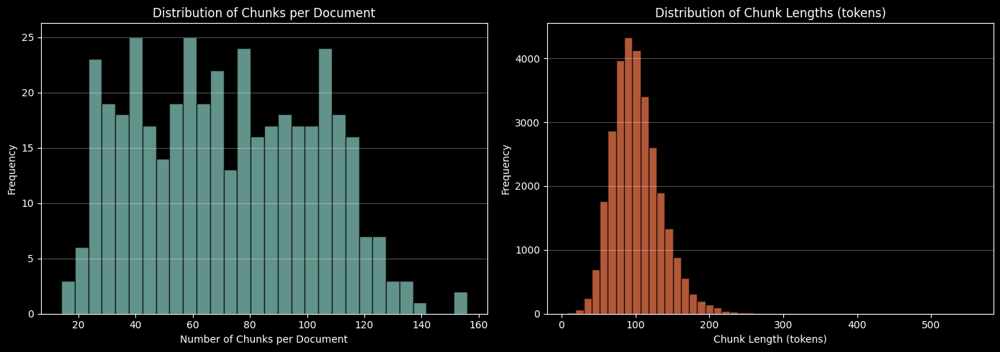


Chunks per document statistics:
count    413.000000
mean      71.808717
std       30.654586
min       14.000000
25%       46.000000
50%       69.000000
75%       98.000000
max      156.000000
dtype: float64


In [39]:
# Visualize chunk distribution
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Distribution of chunks per document
chunks_per_doc = chunks_df.groupby('text_id').size()
axes[0].hist(chunks_per_doc, bins=30, edgecolor='black', alpha=0.7)
axes[0].set_xlabel('Number of Chunks per Document')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Chunks per Document')
axes[0].grid(axis='y', alpha=0.3)

# Distribution of chunk lengths
axes[1].hist(chunks_df['token_count'], bins=50, edgecolor='black', alpha=0.7, color='coral')
axes[1].set_xlabel('Chunk Length (tokens)')
axes[1].set_ylabel('Frequency')
axes[1].set_title('Distribution of Chunk Lengths (tokens)')
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nChunks per document statistics:")
print(chunks_per_doc.describe())

# Embedding

In [27]:
# === Load Environment Variables ===
load_dotenv()  # Loads variables from .env file into environment

# Retrieve database connection parameters from environment variables
DIAL_API_KEY = os.getenv('DIAL_API_KEY')

#print(DIAL_API_KEY)

In [1]:
work_df = chunks_df.copy()
#work_df = work_df.head(200)  # For testing, use only first 200 chunks
work_df

NameError: name 'chunks_df' is not defined

In [41]:
# Batch embedding generation for text chunks
import json
import math
import time
from datetime import date

# Configuration
EMBED_MODEL = "text-embedding-3-large-1"
AZURE_OPENAI_ENDPOINT = "https://ai-proxy.lab.epam.com"
API_VERSION = "2025-04-01-preview"
BATCH_SIZE = 100
SLEEP_BETWEEN_CALLS = 1.0





DIAL_API_KEY = os.getenv("DIAL_API_KEY")
if not DIAL_API_KEY:
    raise EnvironmentError("DIAL_API_KEY not found in environment variables.")

# Initialize Azure OpenAI Embedding client
from openai import AzureOpenAI
emb_client = AzureOpenAI(
    api_key=DIAL_API_KEY,
    api_version=API_VERSION,
    azure_endpoint=AZURE_OPENAI_ENDPOINT,
)

# Prepare texts: first line skill name, second line definition

work_df["chunk_text"] = work_df["chunk_text"].astype(str).str.strip()


texts = work_df["chunk_text"].tolist()
print(f"Total texts to embed: {len(texts)}")

embeddings_records = []
num_batches = math.ceil(len(texts)/BATCH_SIZE)
print(f"Processing in {num_batches} batches (size={BATCH_SIZE}) using model '{EMBED_MODEL}'\n")
start_ts = time.time()

for b in range(num_batches):
    start = b*BATCH_SIZE
    end = min((b+1)*BATCH_SIZE, len(texts))
    batch_texts = texts[start:end]
    batch_text_id = work_df["text_id"].iloc[start:end].tolist()
    batch_chunk_index = work_df["chunk_index"].iloc[start:end].tolist()
    batch_chunk_text = work_df["chunk_text"].iloc[start:end].tolist()
    batch_issue_date = work_df["issue_date"].iloc[start:end].tolist()


    try:
        resp = emb_client.embeddings.create(model=EMBED_MODEL, input=batch_texts)
        # resp.data is a list with .embedding
        if not resp or not hasattr(resp, "data"):
            raise RuntimeError("Unexpected embedding response format")
        vectors = [item.embedding for item in resp.data]
    except Exception as e:
        print(f"\nError embedding batch {b+1}/{num_batches}: {e}")
        vectors = [None]*len(batch_texts)

    for i,(text_id, chunk_index, issue_date, chunk_text, vec) in enumerate(zip(batch_text_id, batch_chunk_index, batch_issue_date, batch_chunk_text, vectors)):
        embeddings_records.append({
            "text_id": text_id,
            "chunk_id": chunk_index,
            "chunk_text": chunk_text,
            "issue_date": issue_date,
            "embedding_3072": json.dumps(vec) if vec is not None else ""
        })

    # Progress output
    if vectors and vectors[0] is not None:
        dim = len(vectors[0])
    else:
        dim = "?"
    print(f"Batch {b+1}/{num_batches} done: rows {start}-{end-1} | dim={dim}")
    time.sleep(SLEEP_BETWEEN_CALLS)

elapsed = time.time() - start_ts
print(f"\nEmbedding complete in {elapsed:.2f}s")

# Build embeddings DataFrame
emb_chunks = pd.DataFrame(embeddings_records)
non_empty = (emb_chunks["embedding_3072"].str.len() > 0).sum()
print(f"Rows embedded (non-empty vectors): {non_empty}/{len(emb_chunks)}")



# Preview
emb_chunks

Total texts to embed: 29657
Processing in 297 batches (size=100) using model 'text-embedding-3-large-1'

Batch 1/297 done: rows 0-99 | dim=3072
Batch 1/297 done: rows 0-99 | dim=3072
Batch 2/297 done: rows 100-199 | dim=3072
Batch 2/297 done: rows 100-199 | dim=3072
Batch 3/297 done: rows 200-299 | dim=3072
Batch 3/297 done: rows 200-299 | dim=3072
Batch 4/297 done: rows 300-399 | dim=3072
Batch 4/297 done: rows 300-399 | dim=3072
Batch 5/297 done: rows 400-499 | dim=3072
Batch 5/297 done: rows 400-499 | dim=3072
Batch 6/297 done: rows 500-599 | dim=3072
Batch 6/297 done: rows 500-599 | dim=3072
Batch 7/297 done: rows 600-699 | dim=3072
Batch 7/297 done: rows 600-699 | dim=3072
Batch 8/297 done: rows 700-799 | dim=3072
Batch 8/297 done: rows 700-799 | dim=3072
Batch 9/297 done: rows 800-899 | dim=3072
Batch 9/297 done: rows 800-899 | dim=3072
Batch 10/297 done: rows 900-999 | dim=3072
Batch 10/297 done: rows 900-999 | dim=3072
Batch 11/297 done: rows 1000-1099 | dim=3072
Batch 11/297 d

,text_id,chunk_id,chunk_text,issue_date,embedding_3072
0,0,0,AI Capabilities and Limitations Limitations of...,2024-04-01,"[-0.0066123297438025475, 0.0003435212420299649..."
1,0,1,person_089 shared a paper introducing a formal...,2024-04-01,"[-0.02121097594499588, 0.0007756356499157846, ..."
2,0,2,They identified two primary issues in current ...,2024-04-01,"[-0.029702523723244667, 0.0018637661123648286,..."
3,0,3,AI Development and Deployment Mojo programming...,2024-04-01,"[-0.007662792690098286, -0.016509875655174255,..."
4,0,4,Claude 3 beating GPT-4 : person_980 reported t...,2024-04-01,"[-0.0014050975441932678, -0.0276342686265707, ..."
...,...,...,...,...,...
29652,412,74,Nemo-CC 2s License Raises Developer Eyebrows :...,2025-11-12,"[-0.05293535813689232, -0.014612188562750816, ..."
29653,412,75,Theme 5. Advancing LLM Research and Developmen...,2025-11-12,"[-0.024329036474227905, -0.009015456773340702,..."
29654,412,76,": Members debated MLE interview preparation , ...",2025-11-12,"[0.014878509566187859, -0.014166240580379963, ..."
29655,412,77,"DSPy Demands Domain Knowledge, Signatures Stil...",2025-11-12,"[0.01698140799999237, -0.011446856893599033, -..."


## Save embeddings

In [43]:
## Save final dataset to CSV

file_path = r'C:\Users\Denis_Davydov2\OneDrive - EPAM\Prophet_AI_docs\Datasets\AI_skills'
file_name = f'smolai_texts_embed_{date.today()}.csv'

emb_chunks.to_csv(file_path + '\\' + file_name, index=False, encoding='utf-8-sig')
print(f"File {file_name} \nuploaded to:", file_path)
print("Total rows", len(emb_chunks))


full_path = os.path.join(file_path, file_name)

if os.path.exists(full_path):
    file_size = os.path.getsize(full_path)
    file_size_mb = file_size / (1024 * 1024)
    print(f"File: {file_name}")
    print(f"Size: {file_size:,} bytes ({file_size_mb:.2f} MB)")
else:
    print(f"File not found: {full_path}")

File smolai_texts_embed_2025-11-16.csv 
uploaded to: C:\Users\Denis_Davydov2\OneDrive - EPAM\Prophet_AI_docs\Datasets\AI_skills
Total rows 29657
File: smolai_texts_embed_2025-11-16.csv
Size: 2,058,655,412 bytes (1963.29 MB)


# Similarity

## Get skill embeddings

In [12]:
# Get text chanks embeddings
file_path = 'C:\\Users\\Denis_Davydov2\\OneDrive - EPAM\\Prophet_AI_docs\\Datasets\\AI_skills\\'
file_name = 'smolai_texts_embed_2025-11-16.csv'


emb_chunks = pd.read_csv(file_path+file_name)
print("File read: ", file_name)
emb_chunks


File read:  smolai_texts_embed_2025-11-16.csv


,text_id,chunk_id,chunk_text,issue_date,embedding_3072
0,0,0,AI Capabilities and Limitations Limitations of...,2024-04-01,"[-0.0066123297438025475, 0.0003435212420299649..."
1,0,1,person_089 shared a paper introducing a formal...,2024-04-01,"[-0.02121097594499588, 0.0007756356499157846, ..."
2,0,2,They identified two primary issues in current ...,2024-04-01,"[-0.029702523723244667, 0.0018637661123648286,..."
3,0,3,AI Development and Deployment Mojo programming...,2024-04-01,"[-0.007662792690098286, -0.016509875655174255,..."
4,0,4,Claude 3 beating GPT-4 : person_980 reported t...,2024-04-01,"[-0.0014050975441932678, -0.0276342686265707, ..."
...,...,...,...,...,...
29652,412,74,Nemo-CC 2s License Raises Developer Eyebrows :...,2025-11-12,"[-0.05293535813689232, -0.014612188562750816, ..."
29653,412,75,Theme 5. Advancing LLM Research and Developmen...,2025-11-12,"[-0.024329036474227905, -0.009015456773340702,..."
29654,412,76,": Members debated MLE interview preparation , ...",2025-11-12,"[0.014878509566187859, -0.014166240580379963, ..."
29655,412,77,"DSPy Demands Domain Knowledge, Signatures Stil...",2025-11-12,"[0.01698140799999237, -0.011446856893599033, -..."


In [13]:
# Get skills embeddings
file_path = 'C:\\Users\\Denis_Davydov2\\OneDrive - EPAM\\Prophet_AI_docs\\Datasets\\AI_skills\\Clusters\\'
file_name = 'skill_embedds_2025-11-13.csv'


skills = pd.read_csv(file_path+file_name)
print("File read: ", file_name)

skills.rename(columns={'embedding': 'embedding_3072', 'term': 'skill_name'}, inplace=True)

skills

File read:  skill_embedds_2025-11-13.csv


,id,skill_name,definition,embedding_3072
0,0,LLM Application Engineering,"Design, build, and deploy LLM-powered applicat...","[-0.016113433986902237, 0.011658730916678905, ..."
1,1,Alexa and AWS Development,"Design, build, and deploy Alexa skills and voi...","[-0.015863992273807526, 0.007875855080783367, ..."
2,2,AI Agent Engineering,"Design, program, and deploy autonomous AI agen...","[-0.008975588716566563, -0.03321722149848938, ..."
3,6,AI Data Engineering,"Ability to design, build, and manage scalable ...","[-0.032141365110874176, 0.004350118804723024, ..."
4,7,Model Quantization and Mixed Precision,"Ability to design, implement, and optimize low...","[-0.017981242388486862, 0.0031784838065505028,..."
...,...,...,...,...
139,136,MCP Server and Agent Development,Build and integrate MCP servers and agents tha...,"[-0.007689556572586298, -0.0217274222522974, -..."
140,135,Low-code No-code AI Development,Build and deploy AI/ML applications and automa...,"[-0.013128919526934624, -0.021230043843388557,..."
141,141,AI Model Risk Management,"Ability to assess, quantify, prioritize, and m...","[-0.027843959629535675, -0.018969332799315453,..."
142,137,GAN Development and Optimization,"Design, implement, and train GAN variants (cGA...","[-0.008705326355993748, -0.033860329538583755,..."


In [14]:

def l2_normalize_embeddings(df, embedding_col='embedding_3072', output_col='embedding_norm'):
    """
    L2 normalize embeddings stored as JSON strings in a dataframe column.
    
    Args:
        df: DataFrame with embedding column
        embedding_col: Name of column containing JSON-encoded embeddings
        output_col: Name of output column for normalized embeddings
    
    Returns:
        DataFrame with new normalized embedding column
    """
    df = df.copy()
    
    # Parse JSON strings to arrays
    embeddings = df[embedding_col].apply(lambda x: np.array(json.loads(x)) if isinstance(x, str) and x.strip() else None)
    
    # Stack into matrix, filtering out None values
    valid_mask = embeddings.notna()
    valid_embeddings = embeddings[valid_mask]
    
    if len(valid_embeddings) == 0:
        df[output_col] = None
        return df
    
    # Stack into matrix
    emb_matrix = np.stack(valid_embeddings.values)
    
    # L2 normalize
    norms = np.linalg.norm(emb_matrix, axis=1, keepdims=True)
    norms = np.maximum(norms, 1e-12)  # Prevent division by zero
    normalized = emb_matrix / norms
    
    # Convert back to list format with native Python floats (using .tolist())
    normalized_series = pd.Series([row.tolist() for row in normalized], index=df[valid_mask].index)
    
    # Initialize output column
    df[output_col] = None
    
    # Assign normalized embeddings
    df.loc[valid_mask, output_col] = normalized_series.values
    
    return df

# Apply L2 normalization to skills dataframe
print("Normalizing skills embeddings...")
skills = l2_normalize_embeddings(skills, embedding_col='embedding_3072', output_col='embedding_3072_norm')
print(f"Skills: {len(skills)} rows, normalized embeddings in 'embedding_3072_norm' column")

# Apply L2 normalization to emb_chunks dataframe  
print("\nNormalizing text chunk embeddings...")
emb_chunks = l2_normalize_embeddings(emb_chunks, embedding_col='embedding_3072', output_col='embedding_3072_norm')
print(f"Chunks: {len(emb_chunks)} rows, normalized embeddings in 'embedding_3072_norm' column")

# Verify normalization (check a few norms should be ~1.0)
sample_skill_norm = skills['embedding_3072_norm'].iloc[0]
if sample_skill_norm is not None:
    norm_check = np.linalg.norm(np.array(sample_skill_norm))
    print(f"\nVerification - Sample skill embedding norm: {norm_check:.6f} (should be ~1.0)")
    print(f"Sample values (first 3): {sample_skill_norm[:3]}")
    print(f"Value types: {[type(v).__name__ for v in sample_skill_norm[:3]]}")

sample_chunk_norm = emb_chunks['embedding_3072_norm'].iloc[0]
if sample_chunk_norm is not None:
    norm_check = np.linalg.norm(np.array(sample_chunk_norm))
    print(f"Verification - Sample chunk embedding norm: {norm_check:.6f} (should be ~1.0)")
    print(f"Sample values (first 3): {sample_chunk_norm[:3]}")
    print(f"Value types: {[type(v).__name__ for v in sample_chunk_norm[:3]]}")

print("\nL2 normalization complete!")
display(skills.head())
display(emb_chunks.head())

Normalizing skills embeddings...
Skills: 144 rows, normalized embeddings in 'embedding_3072_norm' column

Normalizing text chunk embeddings...
Chunks: 29657 rows, normalized embeddings in 'embedding_3072_norm' column

Verification - Sample skill embedding norm: 1.000000 (should be ~1.0)
Sample values (first 3): [-0.016113433639741936, 0.011658730665494178, -0.03398005963668359]
Value types: ['float', 'float', 'float']
Verification - Sample chunk embedding norm: 1.000000 (should be ~1.0)
Sample values (first 3): [-0.006612329409676875, 0.000343521224671595, -0.023613904340920963]
Value types: ['float', 'float', 'float']

L2 normalization complete!


,id,skill_name,definition,embedding_3072,embedding_3072_norm
0,0,LLM Application Engineering,"Design, build, and deploy LLM-powered applicat...","[-0.016113433986902237, 0.011658730916678905, ...","[-0.016113433639741936, 0.011658730665494178, ..."
1,1,Alexa and AWS Development,"Design, build, and deploy Alexa skills and voi...","[-0.015863992273807526, 0.007875855080783367, ...","[-0.015863992092772502, 0.00787585499090652, -..."
2,2,AI Agent Engineering,"Design, program, and deploy autonomous AI agen...","[-0.008975588716566563, -0.03321722149848938, ...","[-0.008975588511837768, -0.033217220740820785,..."
3,6,AI Data Engineering,"Ability to design, build, and manage scalable ...","[-0.032141365110874176, 0.004350118804723024, ...","[-0.032141364379248714, 0.0043501187057024115,..."
4,7,Model Quantization and Mixed Precision,"Ability to design, implement, and optimize low...","[-0.017981242388486862, 0.0031784838065505028,...","[-0.017981243278687224, 0.0031784839639082303,..."


,text_id,chunk_id,chunk_text,issue_date,embedding_3072,embedding_3072_norm
0,0,0,AI Capabilities and Limitations Limitations of...,2024-04-01,"[-0.0066123297438025475, 0.0003435212420299649...","[-0.006612329409676875, 0.000343521224671595, ..."
1,0,1,person_089 shared a paper introducing a formal...,2024-04-01,"[-0.02121097594499588, 0.0007756356499157846, ...","[-0.021210975454448278, 0.0007756356319776091,..."
2,0,2,They identified two primary issues in current ...,2024-04-01,"[-0.029702523723244667, 0.0018637661123648286,...","[-0.029702522864462857, 0.0018637660584782144,..."
3,0,3,AI Development and Deployment Mojo programming...,2024-04-01,"[-0.007662792690098286, -0.016509875655174255,...","[-0.007662792784858048, -0.016509875859338972,..."
4,0,4,Claude 3 beating GPT-4 : person_980 reported t...,2024-04-01,"[-0.0014050975441932678, -0.0276342686265707, ...","[-0.0014050975239007697, -0.027634268227475035..."


## Calculation

In [15]:
from sklearn.metrics.pairwise import cosine_similarity

# Stack normalized embeddings into matrices
print("Preparing embedding matrices...")
skill_vecs = np.stack(skills['embedding_3072_norm'].values)
chunk_vecs = np.stack(emb_chunks['embedding_3072_norm'].values)

print(f"Skills embeddings shape: {skill_vecs.shape}")
print(f"Chunks embeddings shape: {chunk_vecs.shape}")

# Calculate cosine similarity matrix [n_skills x n_chunks]
print("\nCalculating similarity matrix...")
start_time = time.time()
S = cosine_similarity(skill_vecs, chunk_vecs).astype(np.float32)
elapsed = time.time() - start_time

print(f"Similarity matrix shape: {S.shape}")
print(f"Calculation time: {elapsed:.2f}s")
print(f"Memory size: {S.nbytes / (1024**2):.2f} MB")
print(f"\nSimilarity statistics:")
print(f"  Min: {S.min():.4f}")
print(f"  Max: {S.max():.4f}")
print(f"  Mean: {S.mean():.4f}")
print(f"  Median: {np.median(S):.4f}")

# Show sample similarities
print(f"\nSample: Top 5 similarities for first skill '{skills['skill_name'].iloc[0]}':")
skill_0_sims = S[0]
top_5_indices = np.argsort(skill_0_sims)[-5:][::-1]
for idx in top_5_indices:
    print(f"  Chunk {idx}: {skill_0_sims[idx]:.4f} - {emb_chunks['chunk_text'].iloc[idx][:80]}...")

Preparing embedding matrices...
Skills embeddings shape: (144, 3072)
Chunks embeddings shape: (29657, 3072)

Calculating similarity matrix...
Similarity matrix shape: (144, 29657)
Calculation time: 0.76s
Memory size: 16.29 MB

Similarity statistics:
  Min: -0.0443
  Max: 0.7629
  Mean: 0.2797
  Median: 0.2778

Sample: Top 5 similarities for first skill 'LLM Application Engineering':
  Chunk 1533: 0.6698 - Desktop app for local LLM API created a desktop app to interact with LMStudios A...
  Chunk 18600: 0.6557 - A technical perspective is offered on agent development with LLMs: there is a pr...
  Chunk 3572: 0.6296 - LLM-based Agents for Software Engineering : person_108 highlighted a survey pape...
  Chunk 4313: 0.6255 - LLM Training & Evaluation LLM Training & Evaluation : person_328 is still accept...
  Chunk 1677: 0.6158 - Collaborative LLM Development and Deployment Members sought guidance on installi...


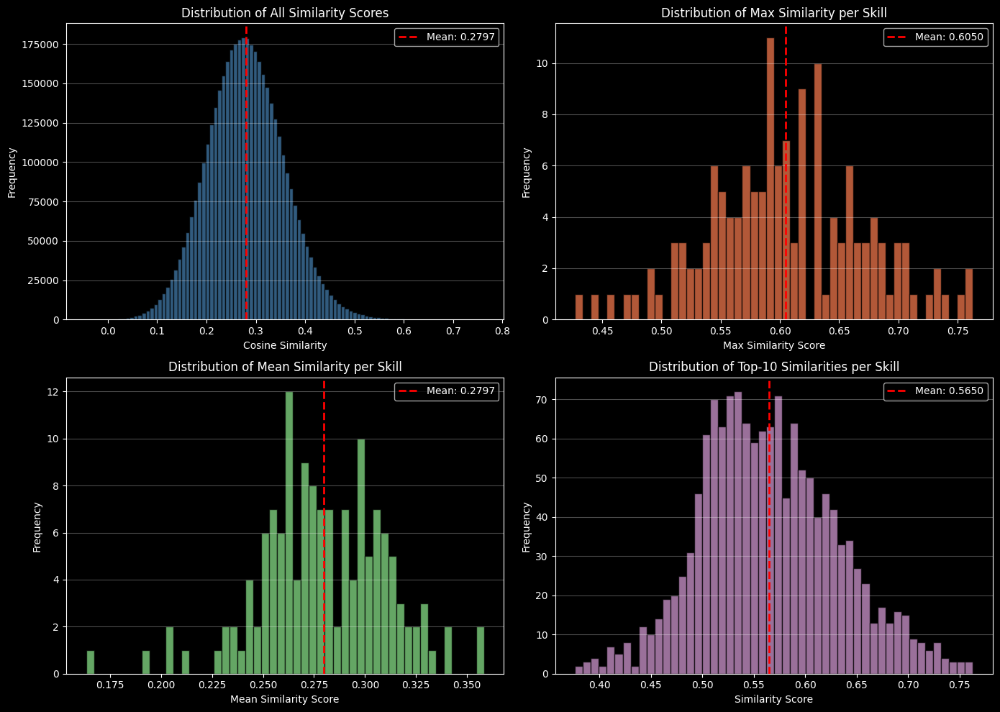


Similarity Analysis:
Skills with max similarity > 0.7: 11 (7.6%)
Skills with max similarity > 0.6: 71 (49.3%)
Skills with max similarity > 0.5: 137 (95.1%)


In [16]:
# Analyze similarity distribution
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# 1. Overall similarity distribution
axes[0, 0].hist(S.flatten(), bins=100, edgecolor='black', alpha=0.7, color='steelblue')
axes[0, 0].set_xlabel('Cosine Similarity')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].set_title('Distribution of All Similarity Scores')
axes[0, 0].axvline(S.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {S.mean():.4f}')
axes[0, 0].legend()
axes[0, 0].grid(axis='y', alpha=0.3)

# 2. Max similarity per skill
max_sims_per_skill = S.max(axis=1)
axes[0, 1].hist(max_sims_per_skill, bins=50, edgecolor='black', alpha=0.7, color='coral')
axes[0, 1].set_xlabel('Max Similarity Score')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].set_title('Distribution of Max Similarity per Skill')
axes[0, 1].axvline(max_sims_per_skill.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {max_sims_per_skill.mean():.4f}')
axes[0, 1].legend()
axes[0, 1].grid(axis='y', alpha=0.3)

# 3. Mean similarity per skill
mean_sims_per_skill = S.mean(axis=1)
axes[1, 0].hist(mean_sims_per_skill, bins=50, edgecolor='black', alpha=0.7, color='lightgreen')
axes[1, 0].set_xlabel('Mean Similarity Score')
axes[1, 0].set_ylabel('Frequency')
axes[1, 0].set_title('Distribution of Mean Similarity per Skill')
axes[1, 0].axvline(mean_sims_per_skill.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_sims_per_skill.mean():.4f}')
axes[1, 0].legend()
axes[1, 0].grid(axis='y', alpha=0.3)

# 4. Top-10 similarities per skill
top_k = 10
top_sims_per_skill = np.sort(S, axis=1)[:, -top_k:].flatten()
axes[1, 1].hist(top_sims_per_skill, bins=50, edgecolor='black', alpha=0.7, color='plum')
axes[1, 1].set_xlabel('Similarity Score')
axes[1, 1].set_ylabel('Frequency')
axes[1, 1].set_title(f'Distribution of Top-{top_k} Similarities per Skill')
axes[1, 1].axvline(top_sims_per_skill.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {top_sims_per_skill.mean():.4f}')
axes[1, 1].legend()
axes[1, 1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nSimilarity Analysis:")
print(f"Skills with max similarity > 0.7: {(max_sims_per_skill > 0.7).sum()} ({(max_sims_per_skill > 0.7).sum() / len(max_sims_per_skill) * 100:.1f}%)")
print(f"Skills with max similarity > 0.6: {(max_sims_per_skill > 0.6).sum()} ({(max_sims_per_skill > 0.6).sum() / len(max_sims_per_skill) * 100:.1f}%)")
print(f"Skills with max similarity > 0.5: {(max_sims_per_skill > 0.5).sum()} ({(max_sims_per_skill > 0.5).sum() / len(max_sims_per_skill) * 100:.1f}%)")